# House Price prediction model

Development of a scikit-learn model able to predict the house price indicator from the explanatory variable capturing different scenarios.

In [1]:
import geopandas as gpd
import numpy as np
import pandas as pd

import contextily 
import palettable.matplotlib as palmpl
import matplotlib.pyplot as plt
import mapclassify
import libpysal

from utils import legendgram

from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_predict, GridSearchCV

/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_6968/881383173.py:1: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [2]:
data_folder = "/Users/martin/Library/CloudStorage/OneDrive-SharedLibraries-TheAlanTuringInstitute/Daniel Arribas-Bel - demoland_data"

Load the data

In [3]:
data = gpd.read_parquet(f"{data_folder}/processed/interpolated/all_oa.parquet")

Filter only explanatory variables.

In [8]:
exvars = data.drop(columns=["geo_code", "geometry", "air_quality_index", "house_price_index", "jobs_accessibility_index", "greenspace_accessibility_index"])

Specify grid search parameters

In [4]:
parameters = {'learning_rate':(0.01, 0.05, 0.1, 0.2, 0.5, 1), 'max_iter':[100, 200, 500], "max_bins": (64, 128, 255)}

Initiate GridSearchCV with Histogram-based Gradient Boosting Regression Tree.

In [6]:
regressor = HistGradientBoostingRegressor(
   random_state=0,
)
est = GridSearchCV(regressor, parameters, verbose=1)

In [11]:
mask = data.house_price_index.notna()

Fit the data.

In [24]:
%%time
est.fit(exvars[mask], data.house_price_index[mask])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
CPU times: user 8min 18s, sys: 13min 18s, total: 21min 37s
Wall time: 13min 49s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1, 0.2, 0.5, 1),
                         'max_bins': (64, 128, 255),
                         'max_iter': [100, 200, 500]},
             verbose=1)

In [25]:
est.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_iter=500, random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [26]:
est.best_score_

0.25446450463994796

In [27]:
y_pred = cross_val_predict(est.best_estimator_, exvars[mask], data.house_price_index[mask], cv=5)

Get the prediction and residuals.

In [28]:
pred = pd.Series(y_pred, index=data[mask].index)
residuals = data.house_price_index[mask] - pred

Check the error

In [29]:
mean_squared_error(data.house_price_index[mask], pred)

248704.12186985405

In [30]:
data.house_price_index[mask].describe()

count    3513.000000
mean     1591.847350
std       583.630015
min       300.549746
25%      1152.094294
50%      1509.777596
75%      1975.173781
max      6925.256593
Name: house_price_index, dtype: float64

Given the mean value is ~16, MSE of 1.34 is not bad, we're within 10% of deviation.

Text(0, 0.5, 'Y pred')

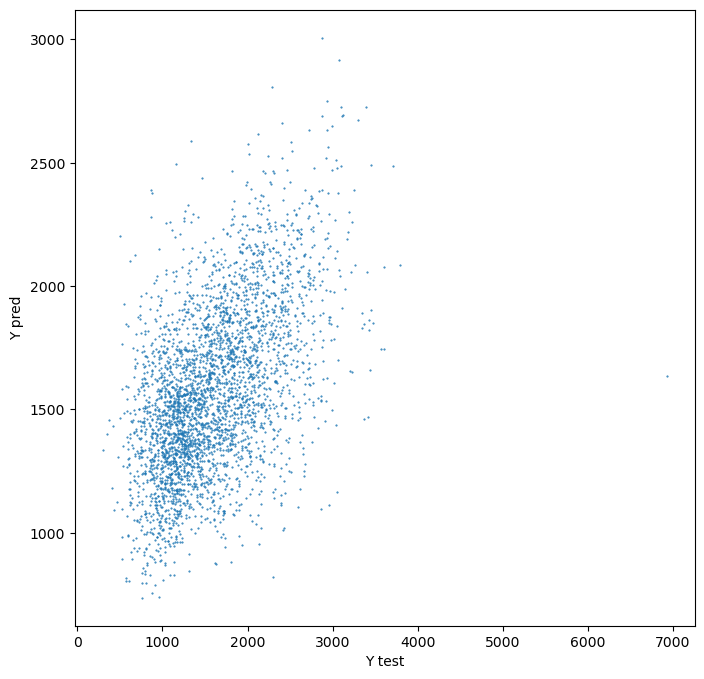

In [31]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.house_price_index[mask], pred, s=.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot results

In [5]:
from shapely.geometry import box

bds = data.total_bounds
extent = gpd.GeoSeries([box((bds[0] - 7000), bds[1], bds[2] + 7000, bds[3])], crs=data.crs).to_crs(3857)

Plot prediction using the same bins as real values.

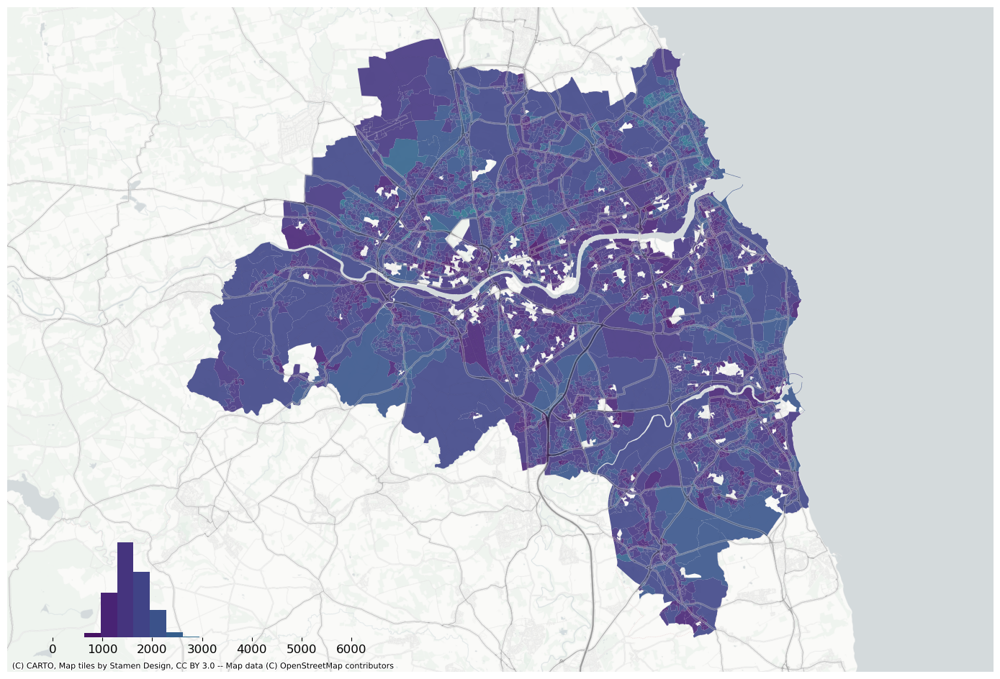

In [33]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(data["house_price_index"].fillna(method="pad").values, k=20).bins

data.assign(pred=pred).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="viridis")
legendgram(
    f,
    ax,
    pred,
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (0, data["house_price_index"].max()), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


Plot residuals

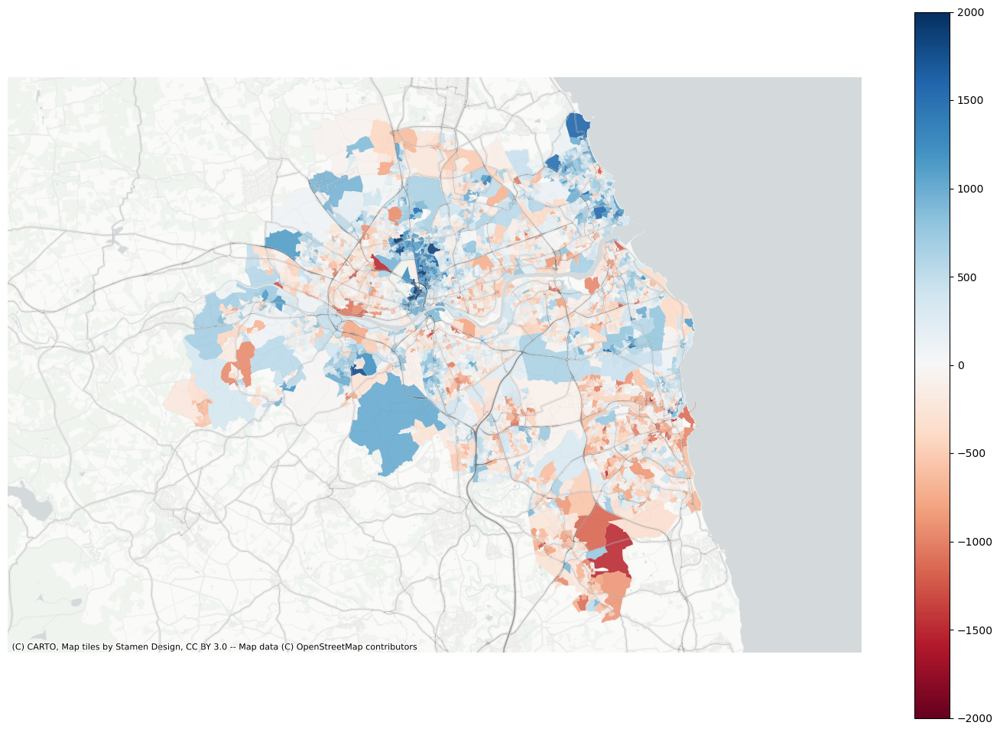

In [36]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals).to_crs(3857).plot("res", ax=ax, alpha=.9, cmap="RdBu", vmin=-2000, vmax=2000, legend=True)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


<AxesSubplot: ylabel='Frequency'>

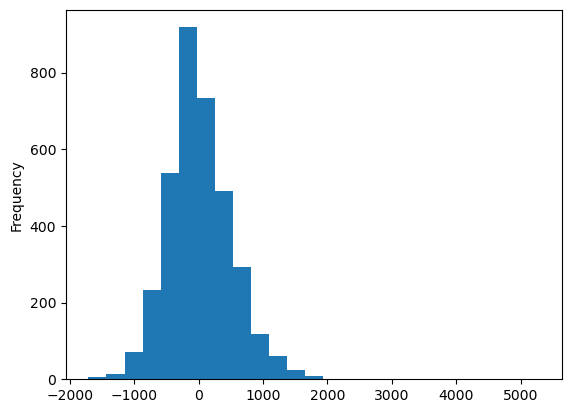

In [35]:
residuals.plot.hist(bins=25)

The results are not great. Given that the mean house price is about 1500 per sq m, the model can be quite off, especially in some location.

## Using spatial lag

We can add a lag into the mix. Let's start with the Queen weights.

In [37]:
queen = libpysal.weights.Queen.from_dataframe(data)
queen.transform = "R"

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


In [38]:
for col in exvars.columns.copy():
    exvars[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
    queen, exvars[col]
)

In [39]:
exvars.head()

,population_estimate,"A, B, D, E. Agriculture, energy and water",C. Manufacturing,F. Construction,"G, I. Distribution, hotels and restaurants","H, J. Transport and communication","K, L, M, N. Financial, real estate, professional and administrative activities","O,P,Q. Public administration, education and health","R, S, T, U. Other",Land cover [Discontinuous urban fabric],...,sdsAre_lag,sisBpM_lag,misCel_lag,ltcRea_lag,ldeAre_lag,lseCCo_lag,lseERI_lag,lteOri_lag,lteWNB_lag,lieWCe_lag
0,315,0.547024,3.146641,5.436732,4.839081,2.065436,4.283496,6.922660,1.606140,1.000000,...,30280.039796,0.064310,28.550796,51.060993,197839.799834,0.409687,0.881904,28.787310,0.014056,0.013885
1,415,0.028774,4.017802,3.870111,33.515266,8.821760,26.432214,83.050968,15.597812,0.152752,...,17776.067815,0.054231,13.316627,60.676470,32812.973123,0.398693,0.937619,20.853156,0.029603,0.001324
2,246,0.110388,1.325208,4.297030,11.481138,2.315769,4.408114,8.930658,3.636795,1.000000,...,54958.015580,0.058214,27.507441,53.117042,216595.359019,0.323117,0.784838,16.607145,0.009236,0.002879
3,277,0.478192,2.732637,4.713528,4.167451,1.776267,3.689214,5.194090,1.366452,0.931788,...,78050.340373,0.062603,29.854903,70.854692,351081.933889,0.398664,0.862998,23.747635,0.009530,0.013940
4,271,0.680069,3.917490,6.768659,6.029714,2.573226,5.335117,8.758326,2.003362,0.696472,...,27462.223773,0.067705,29.971743,52.001773,59309.608454,0.379304,0.890960,18.537922,0.016313,0.004461


In [40]:
regressor_lag = HistGradientBoostingRegressor(
   random_state=0,
)
est_lag = GridSearchCV(regressor_lag, parameters, verbose=1)

Fit the data.

In [42]:
%%time
est_lag.fit(exvars[mask], data[mask].house_price_index)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
CPU times: user 13min 29s, sys: 18min 57s, total: 32min 27s
Wall time: 18min 13s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1, 0.2, 0.5, 1),
                         'max_bins': (64, 128, 255),
                         'max_iter': [100, 200, 500]},
             verbose=1)

In [43]:
est_lag.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=128, max_iter=500,
                              random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [44]:
est_lag.best_score_

0.3852767425712931

In [45]:
y_pred_lag = cross_val_predict(est_lag.best_estimator_, exvars[mask], data[mask].house_price_index, cv=5)

Get the prediction and residuals.

In [46]:
pred_lag = pd.Series(y_pred_lag, index=data[mask].index)
residuals_lag = data[mask].house_price_index - pred_lag

Check the error

In [47]:
mean_squared_error(data[mask].house_price_index, pred_lag)

201453.6577863544

MSE got down from 248704 to 201453 but that still seems to be a bit high (mean error is 448 from 1500 mean value).

Text(0, 0.5, 'Y pred')

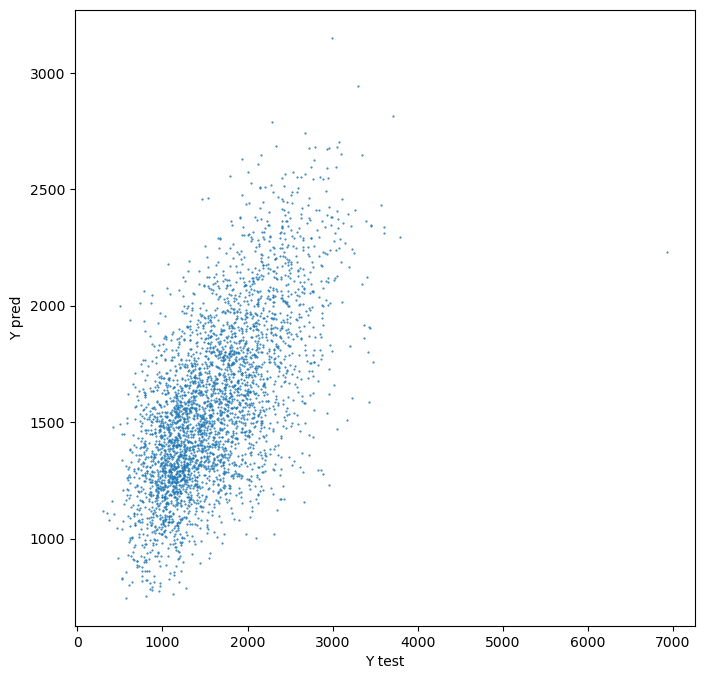

In [48]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.house_price_index[mask], pred_lag, s=.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot prediction using the same bins as real values.

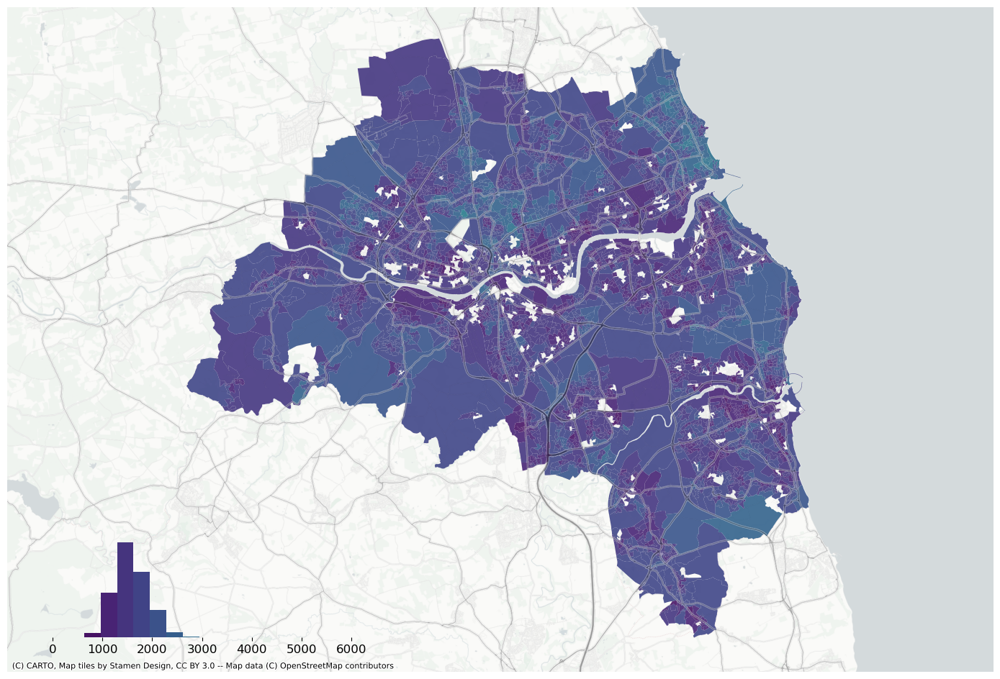

In [49]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(data["house_price_index"].fillna(method="pad").values, k=20).bins

data.assign(pred=pred_lag).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="viridis")
legendgram(
    f,
    ax,
    pred,
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (0, data["house_price_index"].max()), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


Plot residuals

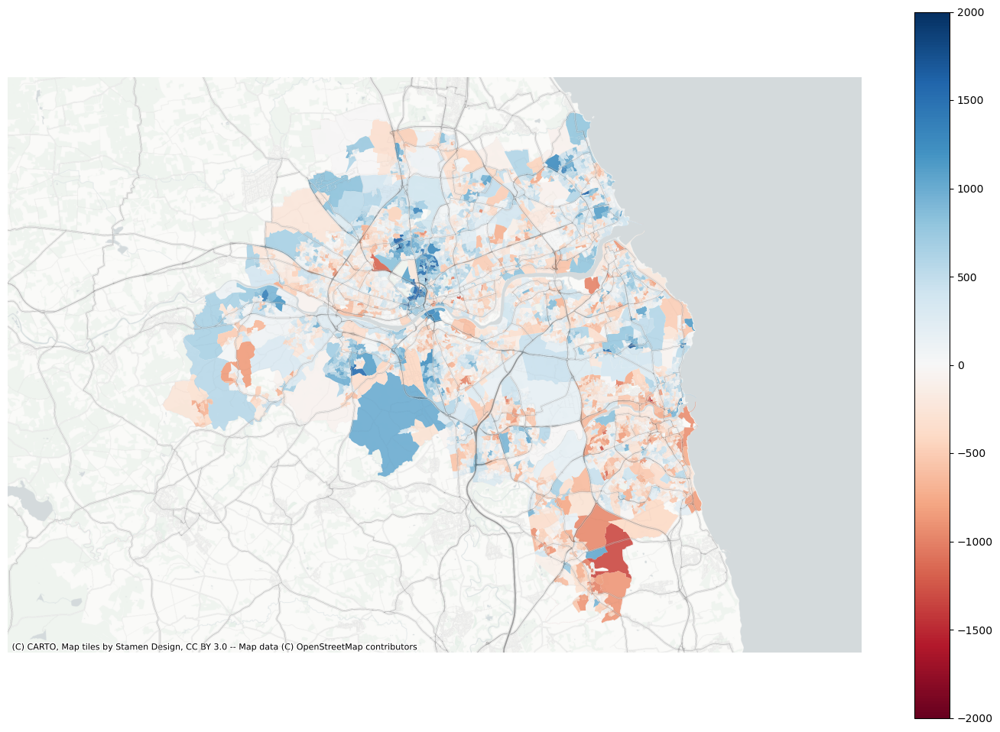

In [50]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals_lag).to_crs(3857).plot("res", ax=ax, alpha=.9, cmap="RdBu", vmin=-2000, vmax=2000, legend=True)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


<AxesSubplot: ylabel='Frequency'>

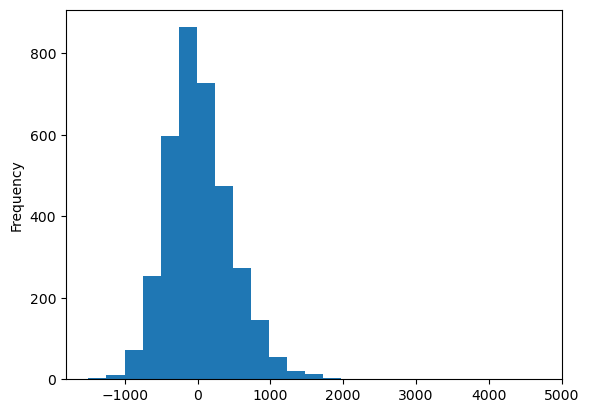

In [51]:
residuals_lag.plot.hist(bins=25)

Overlay of original and a lagged model. No clear indication that the lagged one would be vastly superior.

<AxesSubplot: ylabel='Frequency'>

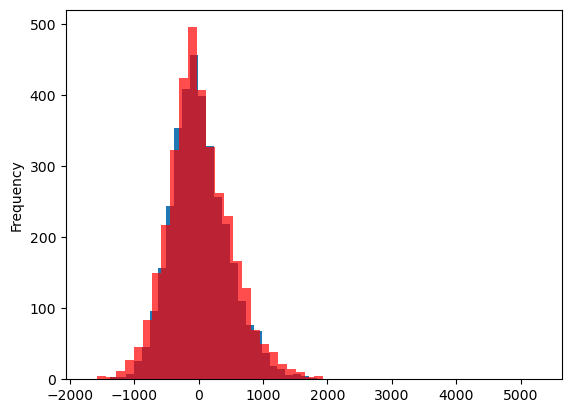

In [52]:
ax = residuals_lag.plot.hist(bins=50)
residuals.plot.hist(bins=50, ax=ax, color='r', alpha=.7)

The average residuals:

In [53]:
residuals_lag.abs().mean(), residuals.abs().mean()

(345.0198428517582, 381.3997073048114)

In [54]:
est_lag.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=128, max_iter=500,
                              random_state=0)

In [55]:
est.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_iter=500, random_state=0)

### Wider weights

In [6]:
queen = libpysal.weights.Queen.from_dataframe(data)
queen3 = libpysal.weights.higher_order(queen, k=3, lower_order=True)

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


In [7]:
queen3.transform = "R"

In [9]:
for col in exvars.columns.copy():
    exvars[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
    queen3, exvars[col]
)

In [10]:
regressor_lag = HistGradientBoostingRegressor(
   random_state=0,
)
est_lag = GridSearchCV(regressor_lag, parameters, verbose=1)

Fit the data.

In [13]:
%%time
est_lag.fit(exvars[mask], data.house_price_index[mask])

Fitting 5 folds for each of 54 candidates, totalling 270 fits
CPU times: user 10min 36s, sys: 11min 30s, total: 22min 6s
Wall time: 13min 58s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1, 0.2, 0.5, 1),
                         'max_bins': (64, 128, 255),
                         'max_iter': [100, 200, 500]},
             verbose=1)

In [14]:
est_lag.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_iter=500, random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [15]:
est_lag.best_score_

0.4753837295272674

In [31]:
%%time 
est_lag.best_estimator_.predict(exvars[mask])

CPU times: user 147 ms, sys: 32.8 ms, total: 180 ms
Wall time: 86 ms


array([1731.20448464, 2830.44054758, 1613.82686231, ..., 1590.77525305,
       2612.76409275, 1496.54246374])

In [16]:
y_pred_lag = cross_val_predict(est_lag.best_estimator_, exvars[mask], data[mask].house_price_index, cv=5)

Get the prediction and residuals.

In [17]:
pred_lag = pd.Series(y_pred_lag, index=data[mask].index)
residuals_lag = data[mask].house_price_index - pred_lag

Check the error

In [18]:
mean_squared_error(data[mask].house_price_index, pred_lag)

168855.00058162943

In [19]:
residuals_lag.abs().mean()

314.2761789390005

Text(0, 0.5, 'Y pred')

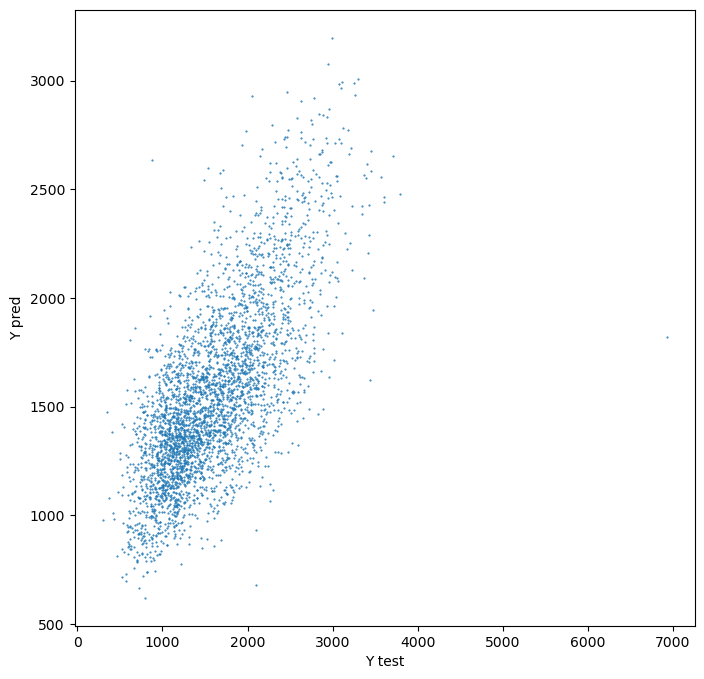

In [20]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.house_price_index[mask], pred_lag, s=.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot prediction using the same bins as real values.

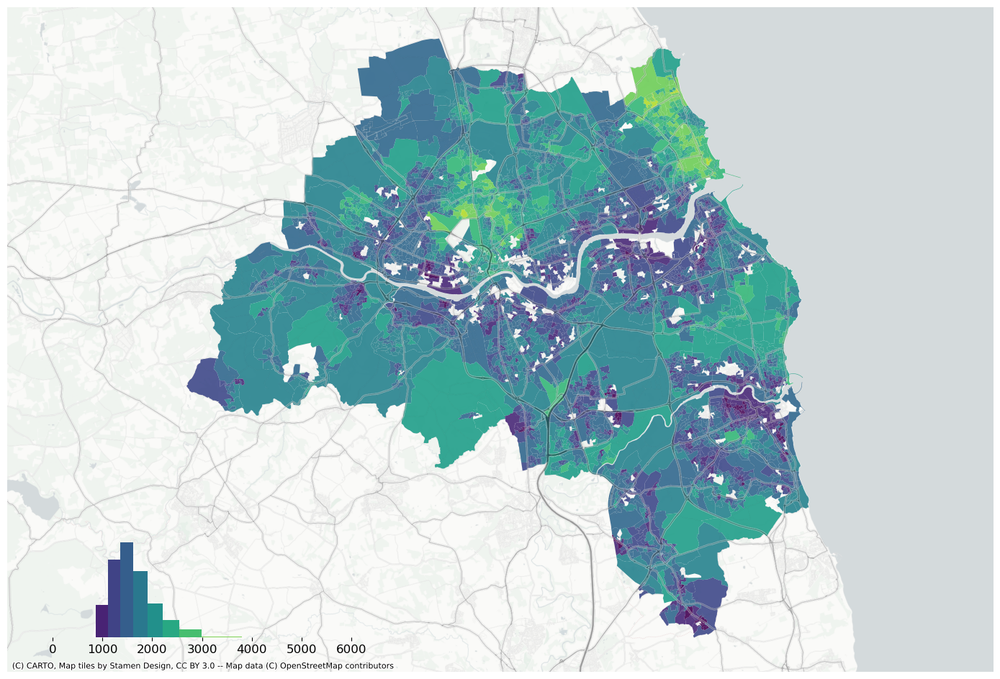

In [25]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.NaturalBreaks(data["house_price_index"].dropna().values, k=10).bins

data.assign(pred=pred_lag).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="viridis")
legendgram(
    f,
    ax,
    pred_lag,
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (0, data["house_price_index"].max()), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


Plot residuals

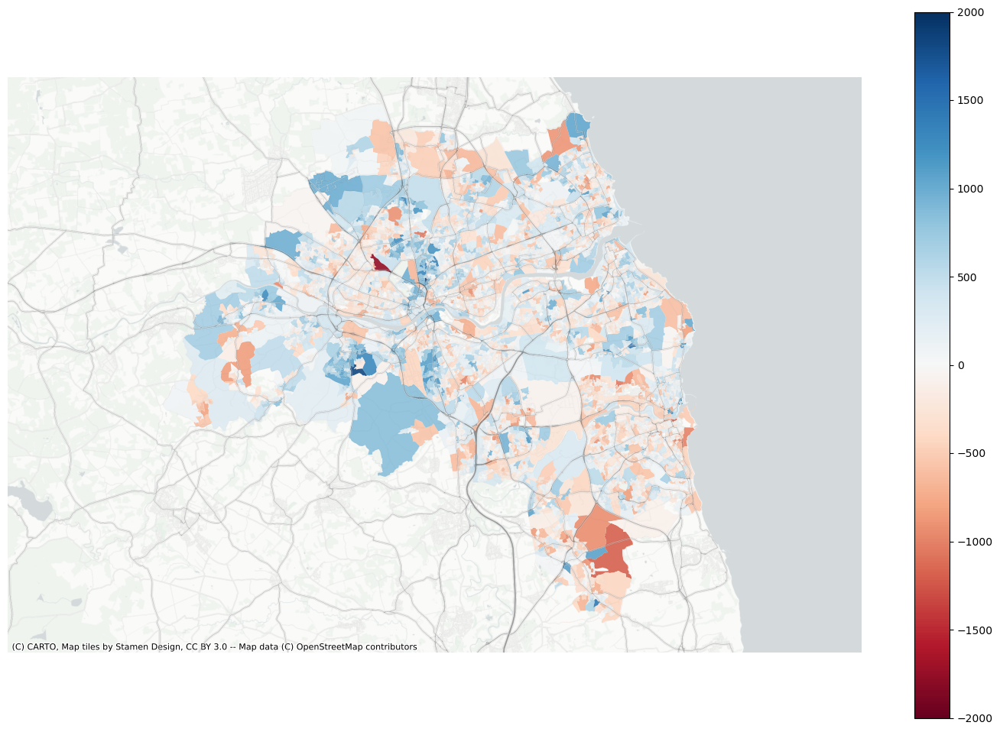

In [26]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals_lag).to_crs(3857).plot("res", ax=ax, alpha=.9, cmap="RdBu", vmin=-2000, vmax=2000, legend=True)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


<AxesSubplot: ylabel='Frequency'>

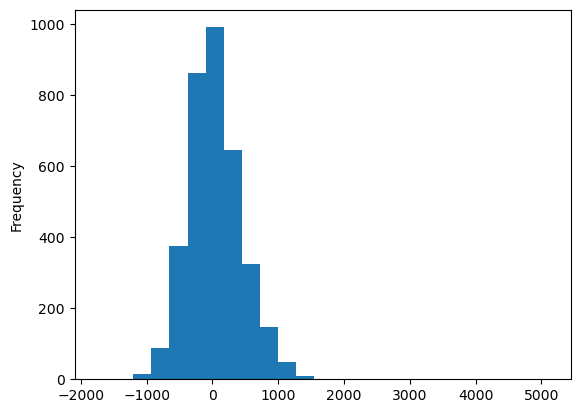

In [27]:
residuals_lag.plot.hist(bins=25)

## Include accessibilities

We can try to include green space and jobs accessibility, as those are likely to affect the house price. We create a lagged model with these two variables on top of explanatory variables.

In [8]:
exvars = data.drop(columns=["geo_code", "geometry", "air_quality_index", "house_price_index"])

In [7]:
queen = libpysal.weights.Queen.from_dataframe(data)
queen.transform = "R"

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


In [8]:
for col in exvars.columns.copy():
    exvars[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
    queen, exvars[col]
)

In [9]:
exvars.head()

,population_estimate,"A, B, D, E. Agriculture, energy and water",C. Manufacturing,F. Construction,"G, I. Distribution, hotels and restaurants","H, J. Transport and communication","K, L, M, N. Financial, real estate, professional and administrative activities","O,P,Q. Public administration, education and health","R, S, T, U. Other",Land cover [Discontinuous urban fabric],...,misCel_lag,ltcRea_lag,ldeAre_lag,lseCCo_lag,lseERI_lag,lteOri_lag,lteWNB_lag,lieWCe_lag,jobs_accessibility_index_lag,greenspace_accessibility_index_lag
0,315,0.547024,3.146641,5.436732,4.839081,2.065436,4.283496,6.922660,1.606140,1.000000,...,28.550796,51.060993,197839.799834,0.409687,0.881904,28.787310,0.014056,0.013885,1582.500000,2.650345e+05
1,415,0.028774,4.017802,3.870111,33.515266,8.821760,26.432214,83.050968,15.597812,0.152752,...,13.316627,60.676470,32812.973123,0.398693,0.937619,20.853156,0.029603,0.001324,10238.400000,1.329411e+06
2,246,0.110388,1.325208,4.297030,11.481138,2.315769,4.408114,8.930658,3.636795,1.000000,...,27.507441,53.117042,216595.359019,0.323117,0.784838,16.607145,0.009236,0.002879,1211.000000,5.170833e+05
3,277,0.478192,2.732637,4.713528,4.167451,1.776267,3.689214,5.194090,1.366452,0.931788,...,29.854903,70.854692,351081.933889,0.398664,0.862998,23.747635,0.009530,0.013940,2275.500000,3.185030e+05
4,271,0.680069,3.917490,6.768659,6.029714,2.573226,5.335117,8.758326,2.003362,0.696472,...,29.971743,52.001773,59309.608454,0.379304,0.890960,18.537922,0.016313,0.004461,1480.142857,3.063273e+05


In [10]:
regressor_lag = HistGradientBoostingRegressor(
   random_state=0,
)
est_lag = GridSearchCV(regressor_lag, parameters, verbose=1)

Fit the data.

In [13]:
%%time
est_lag.fit(exvars[mask], data[mask].house_price_index)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
CPU times: user 19min 33s, sys: 33min 44s, total: 53min 17s
Wall time: 26min 23s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1, 0.2, 0.5, 1),
                         'max_bins': (64, 128, 255),
                         'max_iter': [100, 200, 500]},
             verbose=1)

In [14]:
est_lag.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_iter=500, random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [15]:
est_lag.best_score_

0.40067474727924707

In [16]:
y_pred_lag = cross_val_predict(est_lag.best_estimator_, exvars[mask], data[mask].house_price_index, cv=5)

Get the prediction and residuals.

In [17]:
pred_lag = pd.Series(y_pred_lag, index=data[mask].index)
residuals_lag = data[mask].house_price_index - pred_lag

Check the error

In [18]:
mean_squared_error(data[mask].house_price_index, pred_lag)

196944.98165903118

MSE is only marginally better than before.

Text(0, 0.5, 'Y pred')

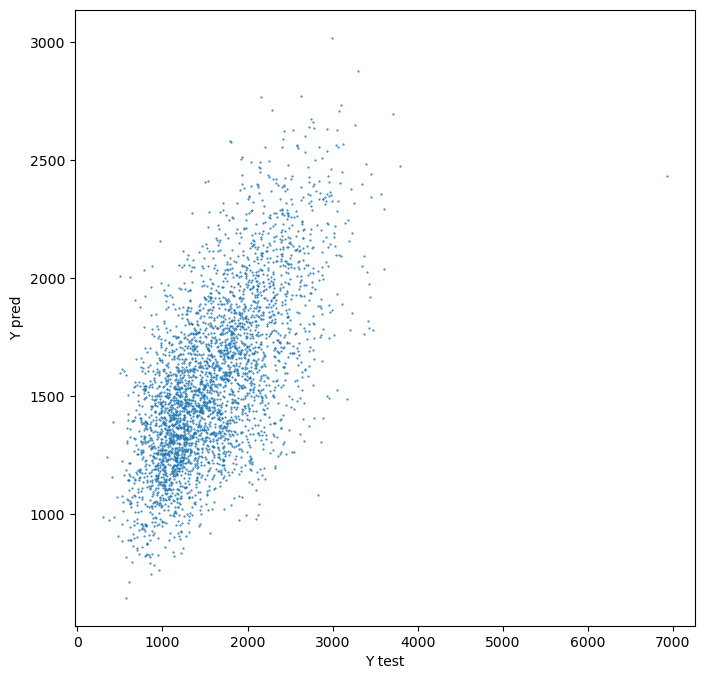

In [19]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.house_price_index[mask], pred_lag, s=.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot prediction using the same bins as real values.

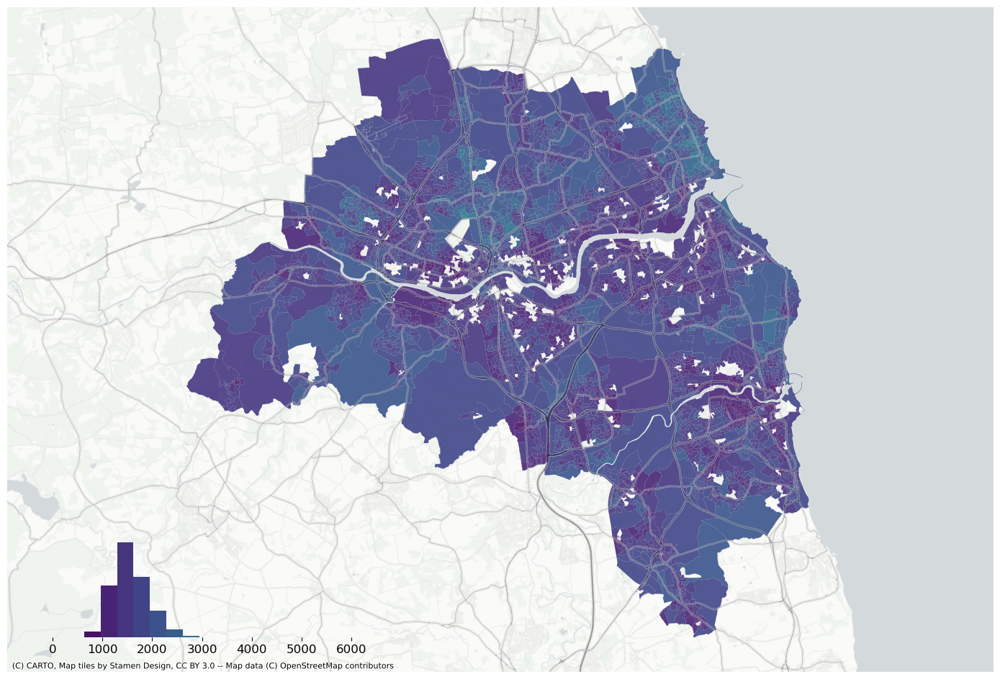

In [23]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.EqualInterval(data["house_price_index"].fillna(method="pad").values, k=20).bins

data.assign(pred=pred_lag).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="viridis")
legendgram(
    f,
    ax,
    pred_lag,
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (0, data["house_price_index"].max()), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


Plot residuals

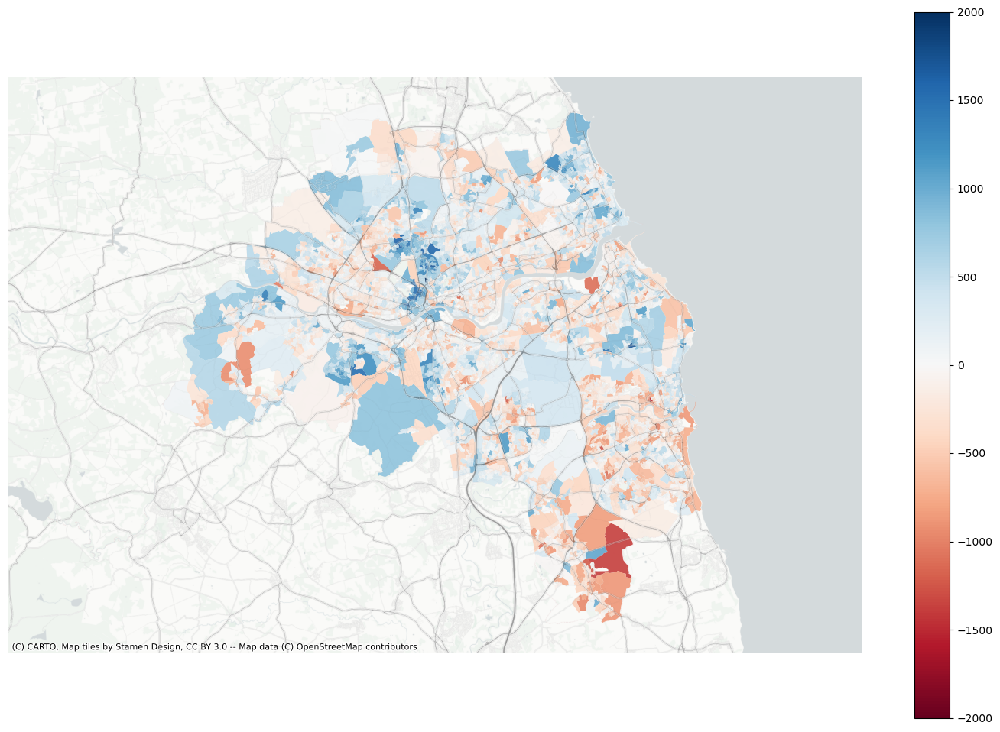

In [24]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals_lag).to_crs(3857).plot("res", ax=ax, alpha=.9, cmap="RdBu", vmin=-2000, vmax=2000, legend=True)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


<AxesSubplot: ylabel='Frequency'>

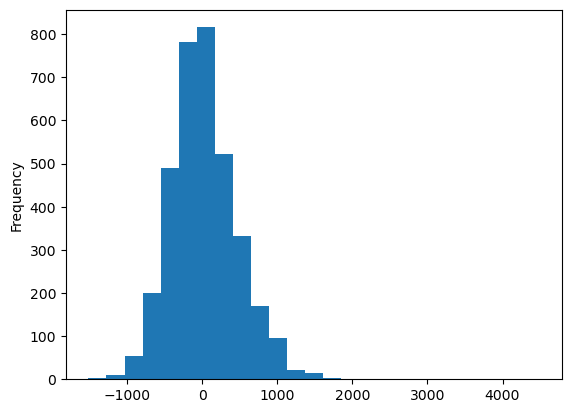

In [ ]:
residuals_lag.plot.hist(bins=25)

Not great so far, it seems that our set of explanatory variables is not explanatory enough to predict house prices in this way...

## With latent representation of Sentinel 2

Try including the lagged latent representation from the postcode Sentinel paper.

In [9]:
latent_oa = pd.read_parquet(f"{data_folder}/processed/sentinel/latent_oa.parquet")

In [10]:
queen = libpysal.weights.Queen.from_dataframe(data)
queen.transform = "R"

/Users/martin/mambaforge/envs/demoland/lib/python3.11/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)


In [11]:
exvars_latent = pd.concat([exvars, latent_oa.drop(columns="geometry")], axis=1)

In [12]:
for col in exvars_latent.columns.copy():
    exvars_latent[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
    queen, exvars_latent[col]
)

/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_54818/186550642.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  exvars_latent[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_54818/186550642.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  exvars_latent[f"{col}_lag"] = libpysal.weights.spatial_lag.lag_spatial(
/var/folders/2f/fhks6w_d0k556plcv3rfmshw0000gn/T/ipykernel_54818/186550642.py:2: PerformanceWarning: DataFrame is highly fragmented.  Th

In [13]:
exvars_latent = exvars_latent.copy()

In [14]:
parameters = {'learning_rate':(0.01, 0.05, 0.1), 'max_iter':[500], "max_bins": (64, 128)}

Initiate GridSearchCV with Histogram-based Gradient Boosting Regression Tree.

In [15]:
regressor = HistGradientBoostingRegressor(
   random_state=0,
)
est_latent = GridSearchCV(regressor, parameters, verbose=1)

Fit the data.

In [17]:
%%time
est_latent.fit(exvars_latent[mask], data[mask].house_price_index)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
CPU times: user 3min 12s, sys: 2min 41s, total: 5min 53s
Wall time: 3min 30s


GridSearchCV(estimator=HistGradientBoostingRegressor(random_state=0),
             param_grid={'learning_rate': (0.01, 0.05, 0.1),
                         'max_bins': (64, 128), 'max_iter': [500]},
             verbose=1)

In [18]:
est_latent.best_estimator_

HistGradientBoostingRegressor(learning_rate=0.05, max_bins=64, max_iter=500,
                              random_state=0)

Test `HistGradientBoostingRegressor` without any pre-processing as a baseline.

In [19]:
est_latent.best_score_

0.42214079367595386

In [20]:
y_pred_latent = cross_val_predict(est_latent.best_estimator_, exvars_latent[mask], data[mask].house_price_index, cv=5)

Get the prediction and residuals.

In [21]:
pred_latent = pd.Series(y_pred_latent, index=data[mask].index)
residuals_latent = data[mask].house_price_index - pred_latent

Check the error

In [22]:
mean_squared_error(data[mask].house_price_index, pred_latent)

190508.98759834783

MSE is only marginally better than before.

Text(0, 0.5, 'Y pred')

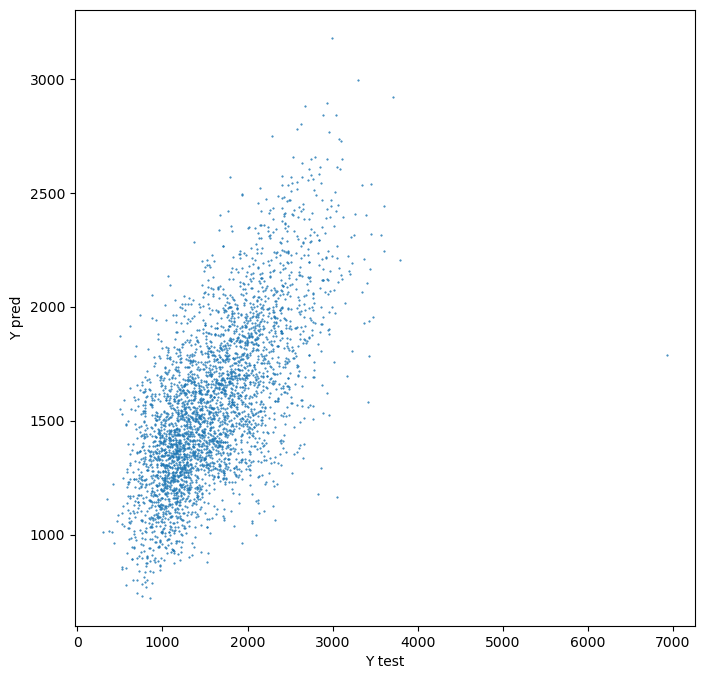

In [23]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.scatter(data.house_price_index[mask], pred_latent, s=.25)
plt.xlabel("Y test")
plt.ylabel("Y pred")

Plot prediction using the same bins as real values.

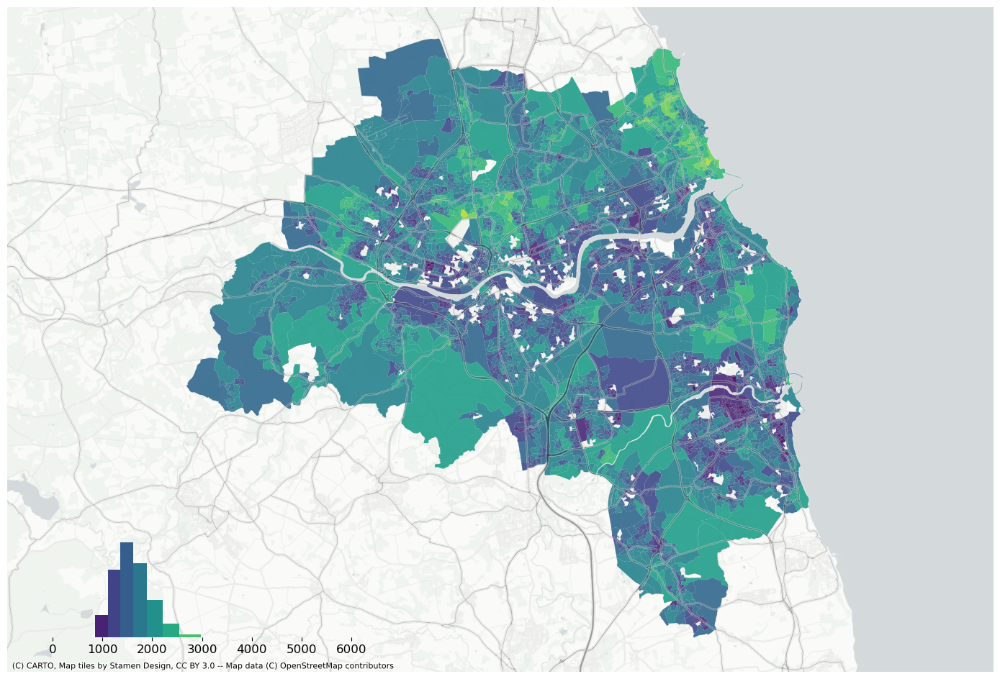

In [25]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.NaturalBreaks(data["house_price_index"].dropna().values, k=10).bins

data.assign(pred=pred_latent).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="viridis")
legendgram(
    f,
    ax,
    pred_latent,
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (0, data["house_price_index"].max()), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


Plot residuals

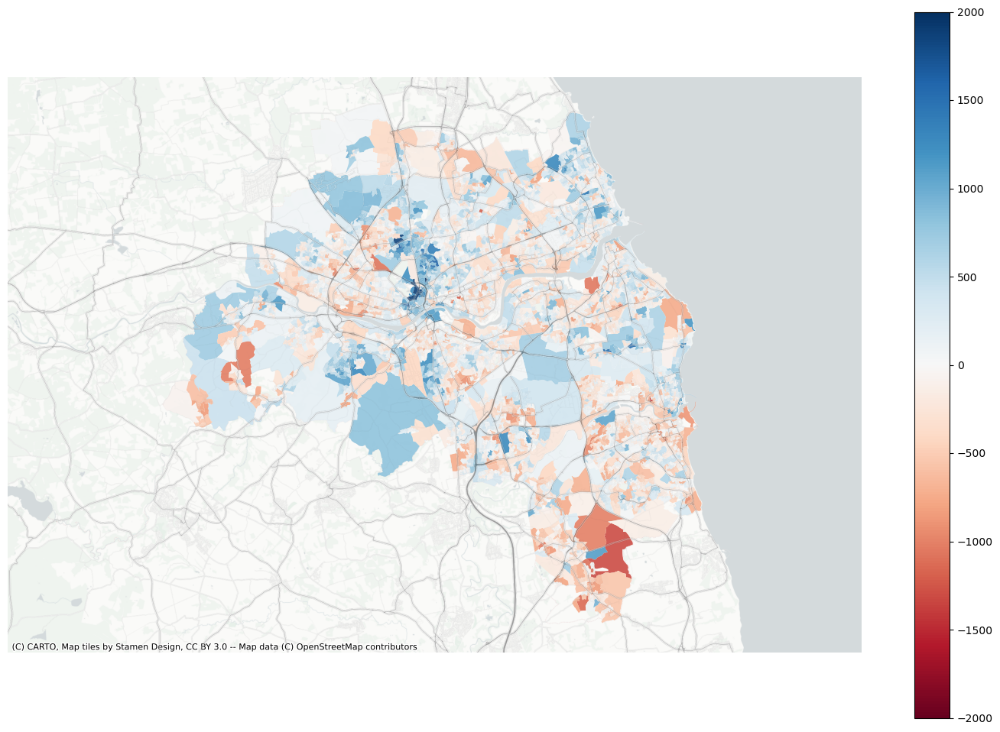

In [26]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
data.assign(res=residuals_latent).to_crs(3857).plot("res", ax=ax, alpha=.9, cmap="RdBu", vmin=-2000, vmax=2000, legend=True)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")


<AxesSubplot: ylabel='Frequency'>

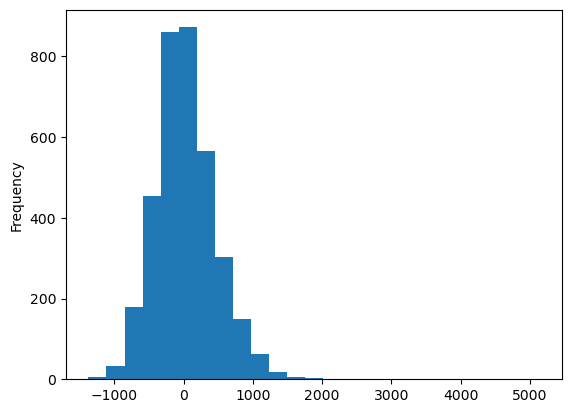

In [27]:
residuals_latent.plot.hist(bins=25)

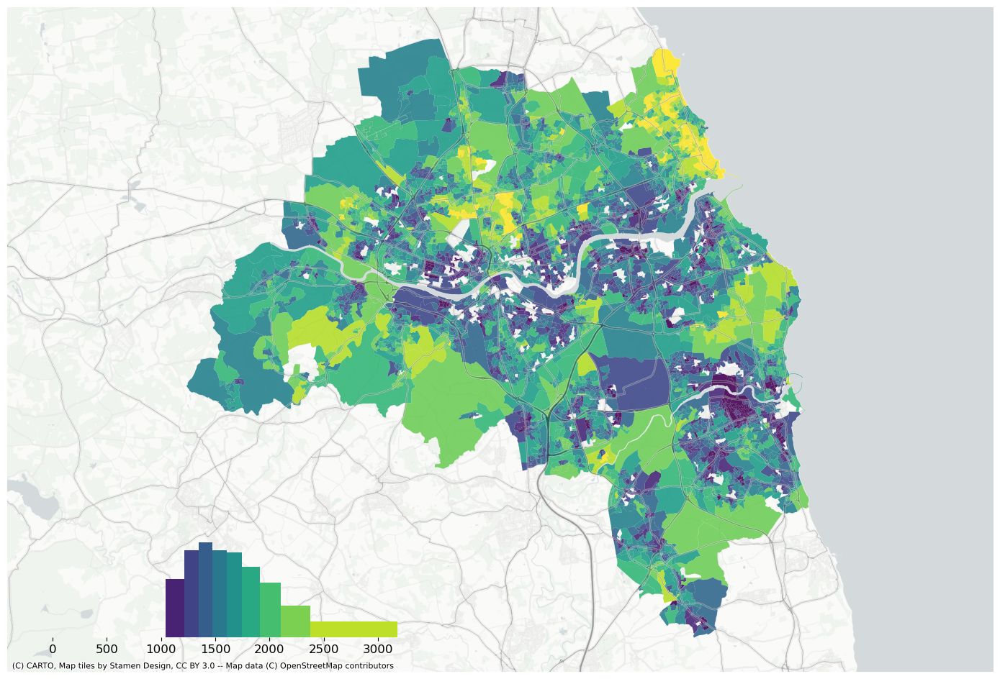

In [28]:
f,ax = plt.subplots(figsize=(18, 12))
extent.plot(ax=ax, alpha=0)
bins = mapclassify.NaturalBreaks(pred_latent.dropna().values, k=10).bins

data.assign(pred=pred_latent).to_crs(3857).plot("pred", scheme="userdefined", classification_kwds={"bins": bins}, ax=ax, alpha=.9, cmap="viridis")
legendgram(
    f,
    ax,
    pred_latent,
    bins,
    pal=palmpl.Viridis_10,
    legend_size=(.35,.15), # legend size in fractions of the axis
    loc = 'lower left', # matplotlib-style legend locations
    clip = (0, pred_latent.max()), # clip the displayed range of the histogram
)
ax.set_axis_off()
contextily.add_basemap(ax=ax, source=contextily.providers.CartoDB.PositronNoLabels, attribution="")
contextily.add_basemap(ax=ax, source=contextily.providers.Stamen.TonerLines, alpha=.4, attribution="(C) CARTO, Map tiles by Stamen Design, CC BY 3.0 -- Map data (C) OpenStreetMap contributors")
# plt.savefig(f"{data_folder}/outputs/figures/air_quality_index.png", dpi=150, bbox_inches="tight")
